# Vehicle Detection


In [1]:
import glob
import time
import os

import numpy as np
import cv2

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from skimage.feature import hog
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import svm

%matplotlib inline

## Parameters

In [2]:
class feature_params():
    def __init__(self):
        self.color_space = 'YCrCb' # hls, hsv, yuv, ycrcb
        # HOG
        self.orients = 11            # 6 - 12
        self.pix_per_cell = 16
        self.cell_per_block = 2
        self.hog_channel = 'ALL'
        # Spatial Bin
        self.spatial_size = (16, 16)
        # Color Histogram
        self.hist_bins = 32
        self.hist_range = (0, 256)

## Helper Functions

In [3]:
def iternate_files(rpath,pattern):
    images = np.array([])
    for subdir, _, _ in os.walk(rpath):
        subset = glob.glob(os.path.join(subdir, pattern))
        if len(subset) > 0:
            images = np.concatenate((images,subset))
    return images

def bin_spatial(img, size=(32, 32)):
    features = cv2.resize(img, size).ravel()
    # print(features.shape)
    return features

def color_hist(img, nbins=32, bins_range=(0, 256)):
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # print(hist_features.shape)
    return hist_features

def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        hog_feature, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                     cells_per_block=(cell_per_block, cell_per_block),
                                     transform_sqrt=True,
                                     visualise=True, feature_vector=feature_vec,
                                     block_norm="L2-Hys")
        return hog_feature, hog_image
    else:
        hog_feature = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                          cells_per_block=(cell_per_block, cell_per_block),
                          transform_sqrt=True,
                          visualise=False, feature_vector=feature_vec,
                          block_norm="L2-Hys")
        return hog_feature

def extract_features(rgbimage, params):
    colorspace = params.color_space
    orients = params.orients
    pix_per_cell = params.pix_per_cell
    cell_per_block = params.cell_per_block
    hog_channel = params.hog_channel
    spatial_size = params.spatial_size
    hist_bins = params.hist_bins
    hist_range = params.hist_range
    
    if colorspace != 'RGB':
        if colorspace == 'HSV':
            feature_image = cv2.cvtColor(rgbimage, cv2.COLOR_RGB2HSV)
        elif colorspace == 'LUV':
            feature_image = cv2.cvtColor(rgbimage, cv2.COLOR_RGB2LUV)
        elif colorspace == 'HLS':
            feature_image = cv2.cvtColor(rgbimage, cv2.COLOR_RGB2HLS)
        elif colorspace == 'YUV':
            feature_image = cv2.cvtColor(rgbimage, cv2.COLOR_RGB2YUV)
        elif colorspace == 'YCrCb':
            feature_image = cv2.cvtColor(rgbimage, cv2.COLOR_RGB2YCrCb)
    else:
        feature_image = np.copy(rgbimage)

#     feature_image = (feature_image - np.min(feature_image))/(np.max(feature_image) - np.min(feature_image))        
    
    if hog_channel == 'ALL':
        hog_feature = []
        for channel in range(feature_image.shape[2]):
            hog_feature.append(get_hog_features(feature_image[:,:,channel], 
                                orients, pix_per_cell, cell_per_block, 
                                vis=False, feature_vec=True))
        hog_feature = np.ravel(hog_feature)        
    else:
        hog_feature = get_hog_features( feature_image[:,:,hog_channel], orients, 
                                        pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True)

    spatial_features = bin_spatial(feature_image, size=spatial_size)
    
    hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=hist_range)

    features = np.concatenate((spatial_features, hist_features, hog_feature))

    return features

In [39]:
def show_2_images_side_by_side(img1, img2, title1='',title2='',cmap1=None,cmap2='gray'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    if cmap1 == None:
        ax1.imshow(img1)
    else:
        ax1.imshow(img1,cmap=cmap1)
    ax1.set_title(title1, fontsize=30)
    ax1.axis('off')
    if cmap2 == None:
        ax2.imshow(img2)
    else:
        ax2.imshow(img2, cmap=cmap2)
    ax2.set_title(title2, fontsize=30)
    ax2.axis('off')
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

def show_images(image_set, title_set=None,counts=None,cmap=None):
    num_image_toshow = len(image_set) if counts is None else counts
    plt.figure(1, figsize=(20, 36))
    for idx in range(num_image_toshow):
        plt.subplot(9,4, idx + 1)
        img = image_set[idx]
        if img.shape[0] >0:
            if cmap is 'gray':
                plt.imshow(img,cmap='gray')
            else:
                plt.imshow(img)
        if title_set is not None:
            s = '{}'.format(title_set[idx])
            plt.title(s)
        plt.axis('off')
        plt.tight_layout()

def show_image_sets(image_files, dataset_zip, titles, col_per_row = 3):
    for file_name,item in zip(image_files,dataset_zip):
        img,car,heat = item
        
        fig = plt.figure(figsize = (32, 12))
        fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.01, wspace = 0.01)
        
        plt.subplot(1,col_per_row,1)
        plt.imshow(img)
        plt.title(file_name,fontsize=20)
        plt.axis('off')
        
        plt.subplot(1,col_per_row,2)
        plt.imshow(car)
        plt.title(titles[0],fontsize=20)
        plt.axis('off')       

        plt.subplot(1,col_per_row,3)
        plt.imshow(heat)
        plt.title(titles[1],fontsize=20)
        plt.axis('off')


## HOG Features

In [5]:
def showHOG(img, title, params):
    img_color = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)

    _, hog_y = get_hog_features(img_color[:,:,0], 
                                params.orients, params.pix_per_cell, params.cell_per_block, 
                                vis=True, feature_vec=True)
    _, hog_Cr = get_hog_features(img_color[:,:,1], 
                                params.orients, params.pix_per_cell, params.cell_per_block, 
                                vis=True, feature_vec=True)
    _, hog_Cb = get_hog_features(img_color[:,:,2], 
                                params.orients, params.pix_per_cell, params.cell_per_block, 
                                vis=True, feature_vec=True)

    fig, axes = plt.subplots(ncols=4, figsize=(15,15))
    axes[0].imshow(img)
    axes[0].set_title(title)
    axes[1].imshow(hog_y, cmap='gray')
    axes[1].set_title('HOG - Y')
    axes[2].imshow(hog_Cr, cmap='gray')
    axes[2].set_title('HOG - Cr')
    axes[3].imshow(hog_Cb, cmap='gray')
    axes[3].set_title('HOG - Cb')

In [6]:
f_params = feature_params()

## Training Data Exploration

In [7]:
cardir = './training_data/vehicles'
noncardir = './training_data/non-vehicles'

In [8]:
carfiles = iternate_files(cardir,'*.png')
noncarfiles = iternate_files(noncardir,'*.png')

print('Car training images: {}'.format(len(carfiles)))
print('Non-car training images: {}'.format(len(noncarfiles)))

Car training images: 8792
Non-car training images: 8968


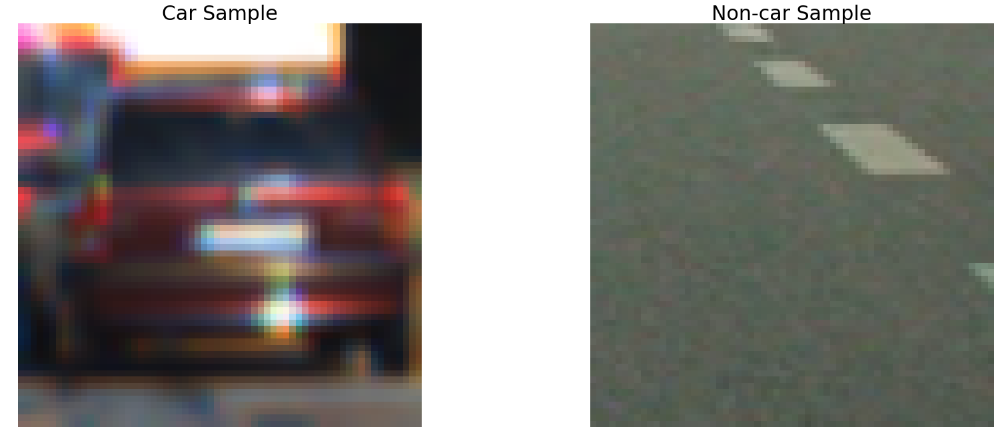

In [9]:
sample_car_file = np.random.choice(carfiles, 1, replace=False)
sample_non_car_file = np.random.choice(noncarfiles, 1, replace=False)

sample_car_image = mpimg.imread(sample_car_file[0])
sample_noncar_image = mpimg.imread(sample_non_car_file[0])

show_2_images_side_by_side(sample_car_image, sample_noncar_image, 
                           title1='Car Sample',title2='Non-car Sample',
                           cmap1=None,cmap2=None)

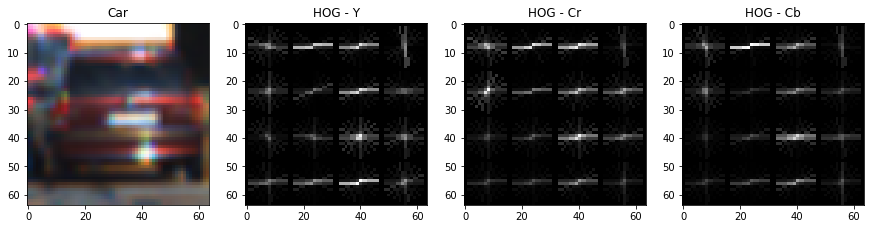

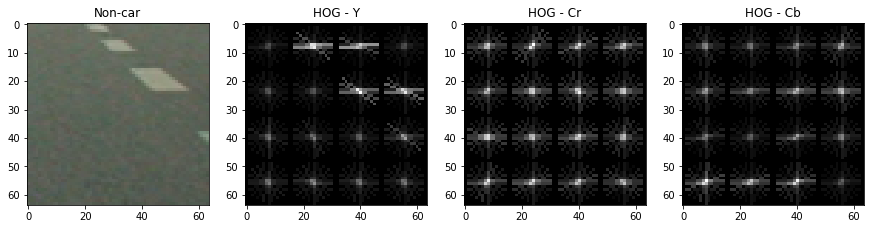

In [10]:
showHOG(sample_car_image, 'Car',f_params)
showHOG(sample_noncar_image, 'Non-car',f_params)

## Training SVM Classifier

In [11]:
t = time.time()

X_train_car = list(map(lambda file: extract_features(cv2.cvtColor(cv2.imread(file),cv2.COLOR_BGR2RGB),f_params),carfiles))
t2 = time.time()

X_train_noncar = list(map(lambda file: extract_features(cv2.cvtColor(cv2.imread(file),cv2.COLOR_BGR2RGB),f_params), noncarfiles))
t3 = time.time()

X = np.vstack((X_train_car, X_train_noncar)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

y = np.hstack((np.ones(len(X_train_car)), np.zeros(len(X_train_noncar))))

rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

In [34]:
# Fitting
t4 = time.time()

# svc = svm.LinearSVC()
# svc.fit(X_train, y_train)

# svm_parameters = {'C':[0.0001, 0.001, 0.1, 1], 'gamma': [0.001, 0.01, 0.1,1]}
# svc = svm.SVC(kernel='rbf')

svm_parameters = {'kernel':('linear', 'rbf'), 'C':[0.01, 0.1, 1, 10]}
svc = svm.SVC()

clf = GridSearchCV(svc, svm_parameters, verbose=2, cv=3)
clf.fit(X_train, y_train)
print('Best parameters:')
print(clf.best_params_)

t5 = time.time()

# accuracy = round(svc.score(X_test, y_test), 4)
accuracy = round(clf.score(X_test, y_test), 4)

print('Training time: {0}'.format(round(t5 - t4, 2)))
print('Test accuracy: {0}'.format(accuracy))

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] kernel=linear, C=0.01 ...........................................
[CV] ............................ kernel=linear, C=0.01, total=  24.8s
[CV] kernel=linear, C=0.01 ...........................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   36.1s remaining:    0.0s


[CV] ............................ kernel=linear, C=0.01, total=  20.2s
[CV] kernel=linear, C=0.01 ...........................................
[CV] ............................ kernel=linear, C=0.01, total=  20.1s
[CV] kernel=rbf, C=0.01 ..............................................
[CV] ............................... kernel=rbf, C=0.01, total= 3.2min
[CV] kernel=rbf, C=0.01 ..............................................
[CV] ............................... kernel=rbf, C=0.01, total= 3.1min
[CV] kernel=rbf, C=0.01 ..............................................
[CV] ............................... kernel=rbf, C=0.01, total= 3.1min
[CV] kernel=linear, C=0.1 ............................................
[CV] ............................. kernel=linear, C=0.1, total=  21.2s
[CV] kernel=linear, C=0.1 ............................................
[CV] ............................. kernel=linear, C=0.1, total=  20.7s
[CV] kernel=linear, C=0.1 ............................................
[CV] .

[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed: 37.0min finished


Best parameters:
{'kernel': 'rbf', 'C': 10}
Training time: 2283.4
Test accuracy: 0.993


In [35]:
svc_best = svm.SVC(kernel='rbf', C=10)
svc_best.fit(X_train, y_train)

acc_best = round(svc_best.score(X_test, y_test), 4)
print(acc_best)

0.993


## Sliding Window

In [13]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step)
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step)
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def draw_boxes(img, bboxes, color=(0, 255, 0), thick=2):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


def pyramid(image, downscale=1.5, minSize=(30, 30)):
    yield image

    while True:
        w = int(image.shape[1] / downscale)
        h = int(image.shape[0] / downscale)
        image = cv2.resize(image, (w,h))
        if image.shape[0] < minSize[1] or image.shape[1] < minSize[0]:
            break
        yield image


In [14]:
# Heat map and threshold functions from Udacity's course

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,255,0), 6)
    # Return the image
    return img

def apply_heatmap(img, boxes,th=4):
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heatmap = add_heat(heat, boxes)
    heatmap = apply_threshold(heatmap, threshold=th)
    return heatmap

In [37]:
all_test_images_set = glob.glob('./test_images/*.jpg')
org_image_set = list(map(lambda f: cv2.cvtColor(cv2.imread(f),cv2.COLOR_BGR2RGB), all_test_images_set))

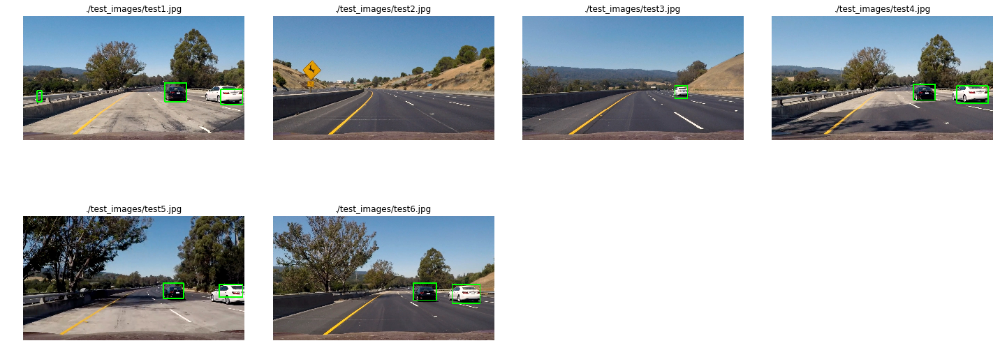

In [42]:
from scipy.ndimage.measurements import label

car_image_set = []
heat_map_set = []

for t_img_file in all_test_images_set:
    t_img = cv2.cvtColor(cv2.imread(t_img_file),cv2.COLOR_BGR2RGB)
    
    ty = 380
    by = 656
    lx = 0
    rx = 1280
    slide_windows = slide_window(t_img,x_start_stop=[lx,rx], y_start_stop=[ty,by], 
                                 xy_window=[64,64], xy_overlap=[0.85,0.85])

    car_windows = []
    for win in slide_windows:
        sub_img = cv2.resize(t_img[win[0][1]:win[1][1], win[0][0]:win[1][0]], (64, 64))
        all_features = extract_features(sub_img, f_params)
        scaled_all_features = X_scaler.transform(all_features.reshape(1, -1))
        pred = svc_best.predict(scaled_all_features)
        if pred == 1:
            car_windows.append(win)

    recopy = np.copy(t_img)    
    
    heatmap = apply_heatmap(recopy,car_windows,th=4)
    heat_map_set.append(heatmap)
    
    labels = label(heatmap)
    recopy =  draw_labeled_bboxes(recopy, labels)

#     recopy = draw_boxes(recopy, car_windows)
    
    car_image_set.append(recopy)

show_images(car_image_set,all_test_images_set)

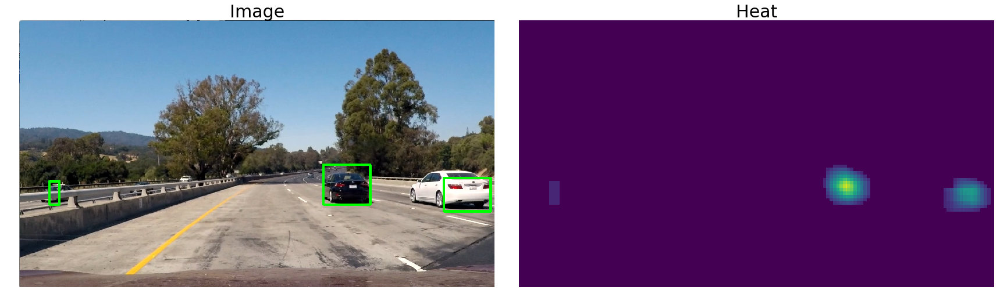

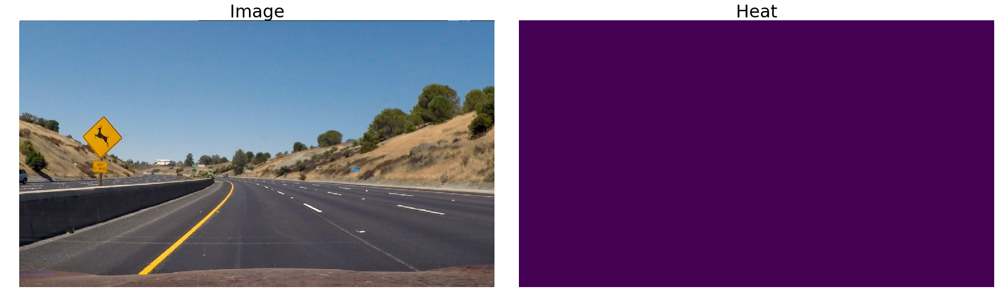

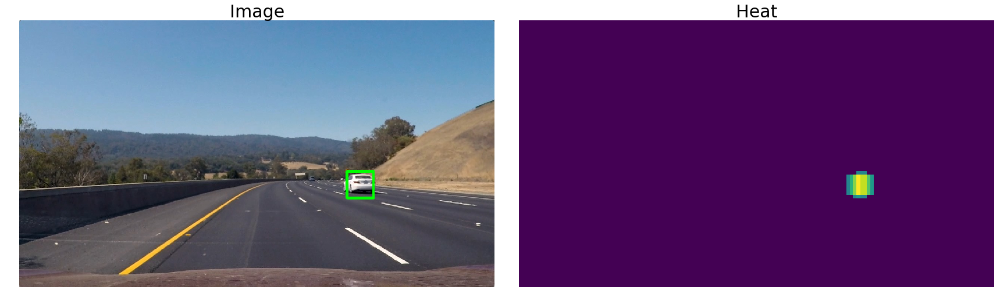

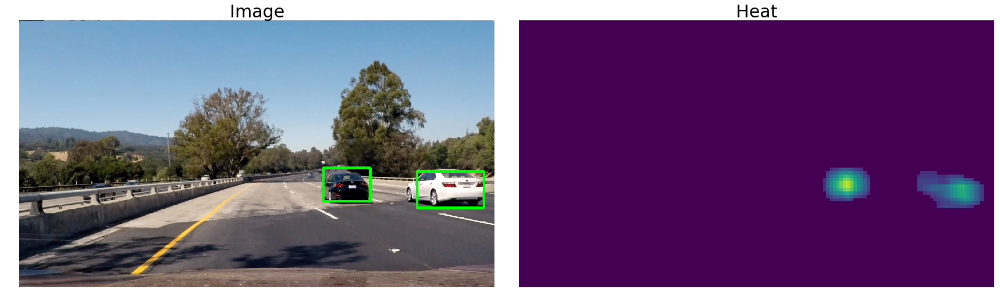

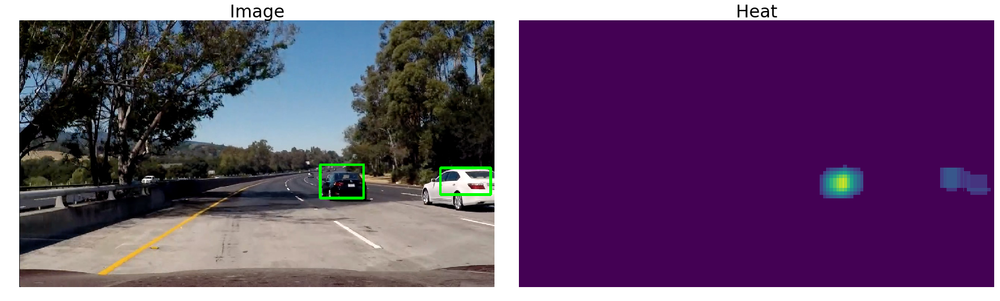

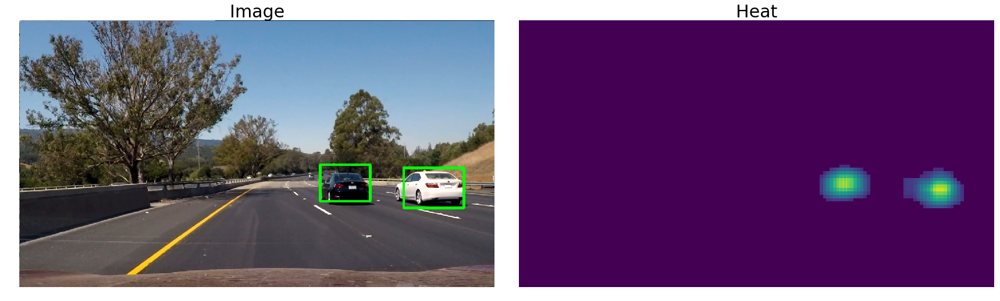

In [17]:
for img, heat in zip(car_image_set,heat_map_set):
    show_2_images_side_by_side(img, heat, 
                           title1='Image',title2='Heat',
                           cmap1=None,cmap2=None)

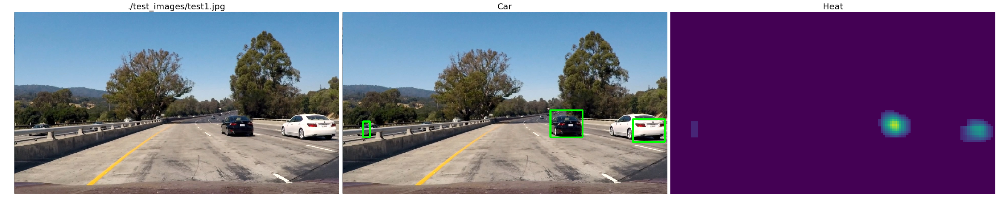

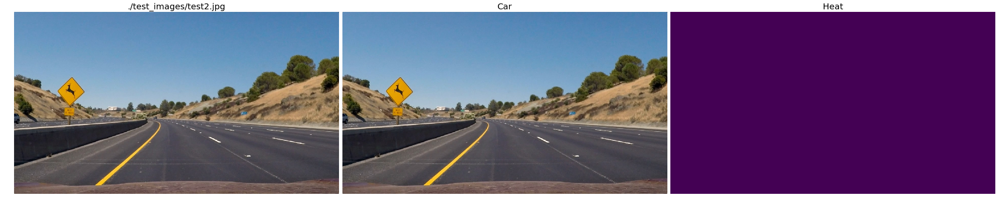

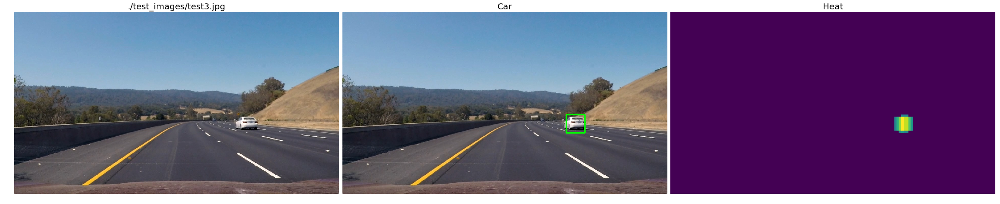

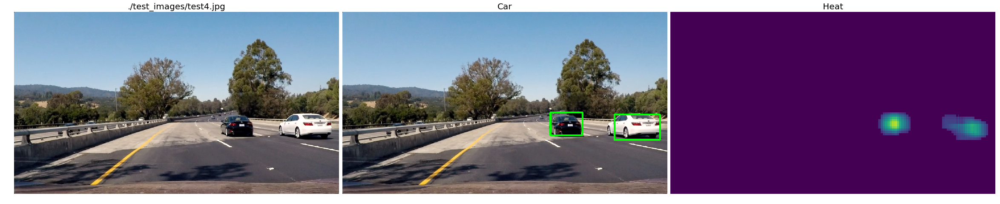

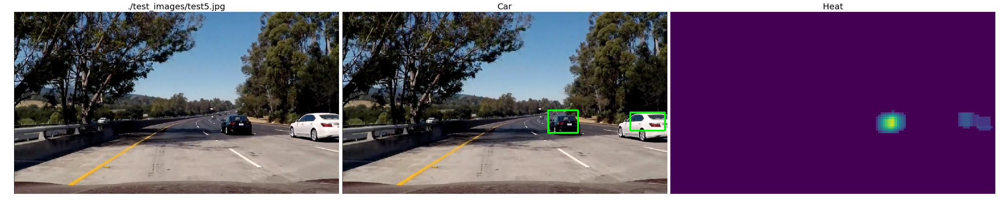

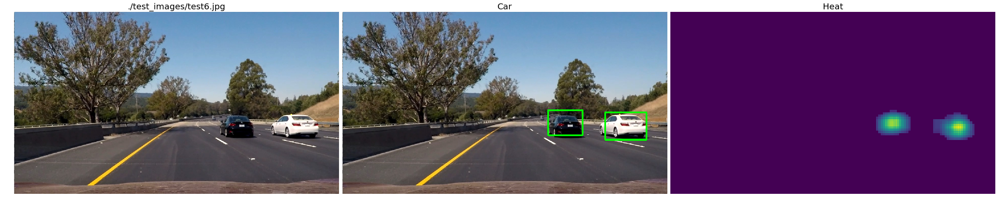

In [40]:
titles = ['Car','Heat']

show_image_sets(all_test_images_set, zip(org_image_set,car_image_set,heat_map_set),titles)

## Hog Sub-sampling Window Search

In [18]:
def find_car_boxes(img, y_start_stop=[350, 656], window=64, cells_per_step=1, scale=1.5 ):
    # Parameters extraction
    # HOG parameters
    cspace = f_params.color_space
    orient = f_params.orients
    pix_per_cell = f_params.pix_per_cell
    cell_per_block = f_params.cell_per_block
    hog_channel = f_params.hog_channel
    # Spatial parameters
    size = f_params.spatial_size
    # Histogram parameters
    hist_bins = f_params.hist_bins
    hist_range = f_params.hist_range
    
    # Image color space changes
    # apply color conversion if other than 'RGB'
    if cspace != 'RGB':
        if cspace == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    
    ystart, ystop = y_start_stop
    ctrans_tosearch = feature_image[ystart:ystop,:,:]
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    car_windows = []
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=size)
            hist_features = color_hist(subimg, nbins=hist_bins, bins_range=hist_range)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            test_prediction = svc_best.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                car_windows.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return car_windows

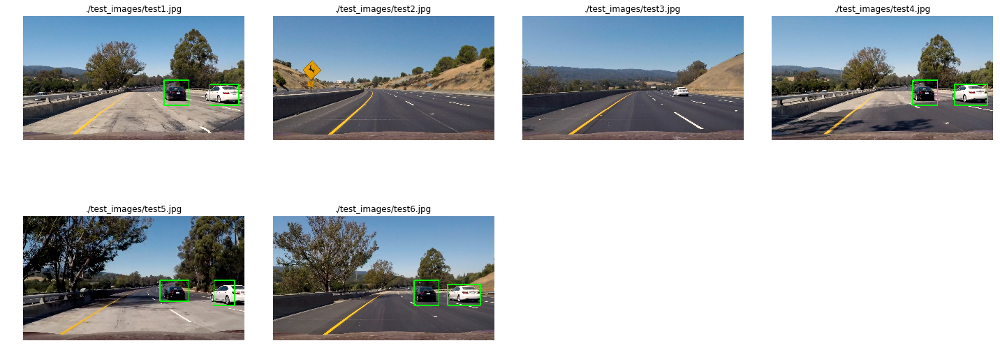

In [23]:
from scipy.ndimage.measurements import label

car_image_set_fast = []
heatmap_set_fast = []
for t_img_file in all_test_images_set:
    t_img = cv2.cvtColor(cv2.imread(t_img_file),cv2.COLOR_BGR2RGB)
    car_boxes_fast = find_car_boxes(t_img)

    car_img = np.copy(t_img)
    
#     car_img = draw_boxes(car_img,car_boxes_fast)
    
    # Apply heatmap
    heatmap = apply_heatmap(car_img,car_boxes_fast,th=1)
    heatmap_set_fast.append(heatmap)
    labels = label(heatmap)
    car_img =  draw_labeled_bboxes(car_img, labels)
    
    car_image_set_fast.append(car_img)

show_images(car_image_set_fast,all_test_images_set)

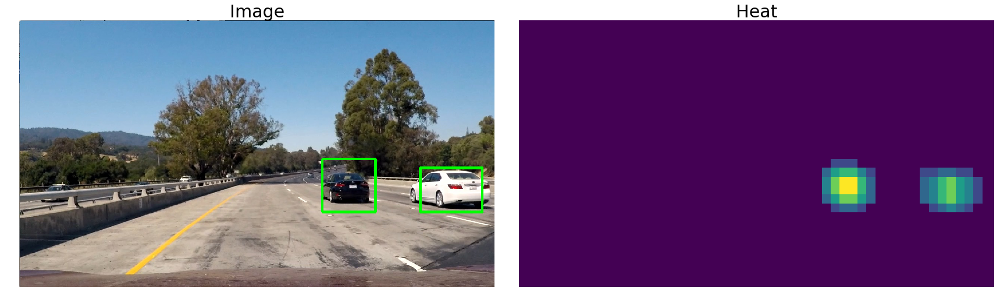

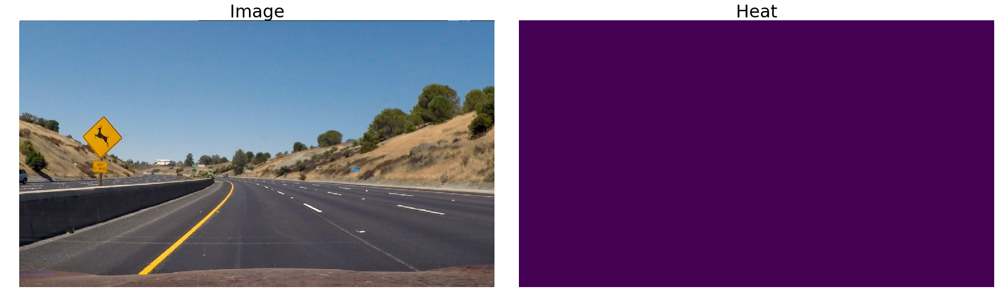

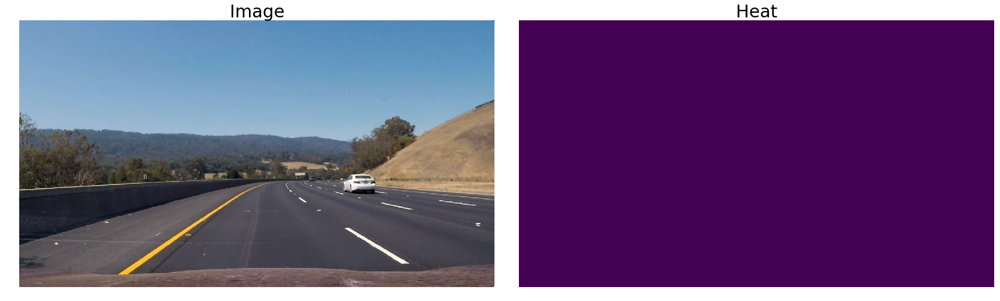

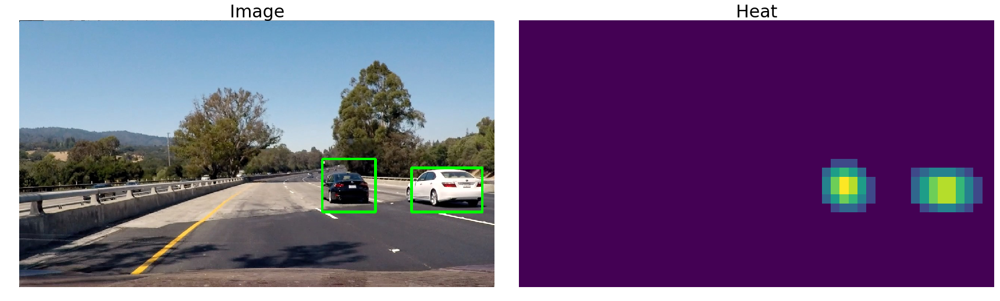

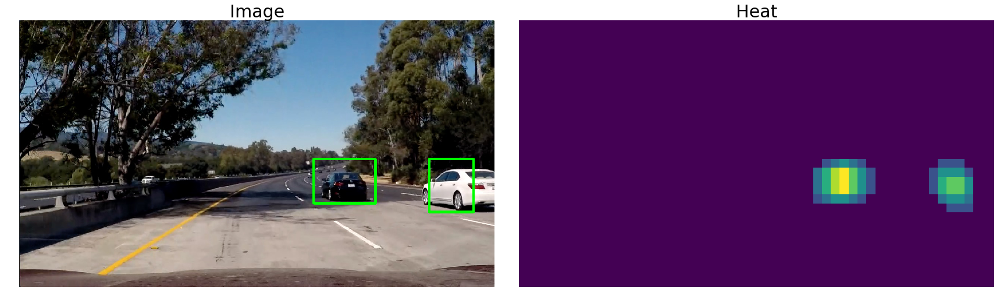

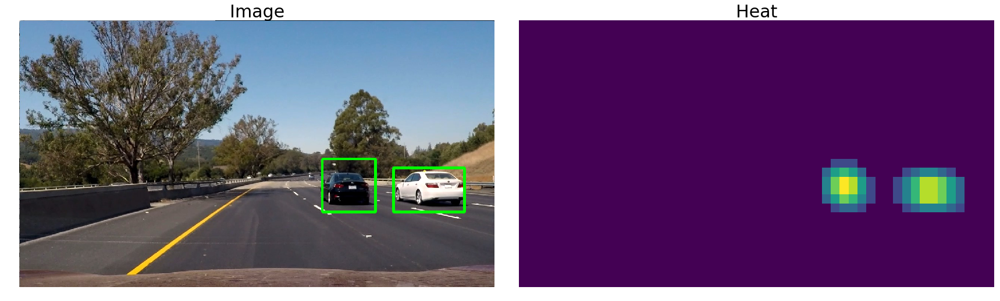

In [24]:
for img, heat in zip(car_image_set_fast,heatmap_set_fast):
    show_2_images_side_by_side(img, heat, 
                           title1='Image',title2='Heat',
                           cmap1=None,cmap2=None)

## Video Pipeline

In [ ]:
def find_car_window_sliding_window(img, y_ss=[380, 656]):
    slide_windows = slide_window(img,x_start_stop=[0,1280], y_start_stop=y_ss, 
                                 xy_window=[64,64], xy_overlap=[0.85,0.85])

    car_windows = []
    for win in slide_windows:
        sub_img = cv2.resize(img[win[0][1]:win[1][1], win[0][0]:win[1][0]], (64, 64))
        all_features = extract_features(sub_img, f_params)
        scaled_all_features = X_scaler.transform(all_features.reshape(1, -1))
        pred = svc_best.predict(scaled_all_features)
        if pred == 1:
            car_windows.append(win)

    return car_windows

In [31]:
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip

class HeatHistory():
    def __init__(self):
        self.history = []
        self.acc = None

def processVideo(inputVideo, outputVideo, frames_to_remember=3, thd=1):

    history = HeatHistory()

    def pipeline(img):
        boxes = find_car_boxes(img)
#         boxes = find_car_window_sliding_window(img)
    
        img_shape = img.shape

        heat = np.zeros_like(img[:,:,0]).astype(np.float)
        heatmap = add_heat(heat, boxes)
        
        if history.acc is None:
            history.acc = np.zeros_like(heat)
        
        if len(history.history) >= frames_to_remember:
            history.history = history.history[1:]
            history.acc = history.acc - history.history[0]

        history.history.append(heatmap)
        history.acc = history.acc + heatmap
        
        if len(history.history) >= frames_to_remember:
            heatmap = history.acc / frames_to_remember
        
        heatmap = apply_threshold(heatmap, threshold=thd)

        labels = label(heatmap)
        return draw_labeled_bboxes(np.copy(img), labels)


    myclip = VideoFileClip(inputVideo)
    output_video = myclip.fl_image(pipeline)
    output_video.write_videofile(outputVideo, audio=False)
    
processVideo('./project_video.mp4', './project_video_output.mp4', thd=1)
# processVideo('./test_video.mp4', './test_video_output.mp4', thd=1)

[MoviePy] >>>> Building video ./project_video_output.mp4
[MoviePy] Writing video ./project_video_output.mp4


100%|█████████▉| 1260/1261 [47:25<00:02,  2.27s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_output.mp4 



In [33]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_video_output.mp4'))